 <a id='top'></a>
## Table of Contents

[1.](#view_data) View data.

[2.](#initial_forecast) Model and feature exploration

   - I experiment with a few types of feature encoding with linear and random forest models.

[3.](#additional_features) Additional experimentation. 

   - I describe some experimentation with repeating basis functions in linear models, but they dont out perform the random forest.

[4.](#select_model) Results and model selection.



In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

 <a id='view_data'></a>

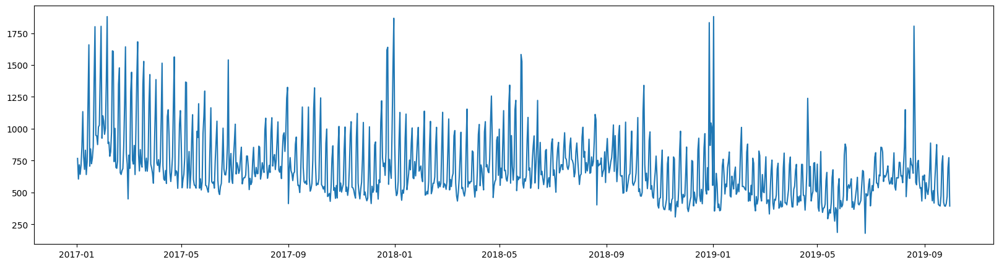

In [2]:
# load data 
data = pd.read_csv("data_trc.csv")
data["date"] = pd.to_datetime(data["date"])

# sum over all products and stores per date
data = data.groupby("date").agg({"sales":"sum"})
data = data.sort_values("date")

plt.figure(figsize=(20,5))
plt.plot(data["sales"])

Viewing the total sales per day it's clear there is strong weekly periodicity as well as a dynamic trend over months and years time-scales.

Additionally, there are a couple outliers near the end of the year around Christmas. 

[back to top](#top)

 <a id='initial_forecast'></a>
 
###  Model and feature exploration
An initial forecasting method we can try is to fit a linear model with features describing the components of the date, day, week, month, year. 


First define a class to generate features based on these date components. This will be used later in an SKlearn pipeline. 

 [back to top](#top)

In [3]:
from sklearn.base import BaseEstimator, TransformerMixin

In [4]:
class ExtractDateComponents(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X):
        return pd.DataFrame({"dayofyear": X["date"].apply(lambda y: y.dayofyear),
                             "dayofweek": X["date"].apply(lambda y: y.dayofweek),
                             "weekofyear": X["date"].apply(lambda y: y.isocalendar().week),
                             "monthofyear": X["date"].apply(lambda y: y.month), 
                             "year": X["date"].apply(lambda y: y.year)},
                            index=X.index)

In [5]:
# Feature vectors
X = ExtractDateComponents().fit(data.reset_index()).transform(data.reset_index())

# reset index to datetime. this is to make the plots nicer but doesnt affect the model fitting
X.index = data.index

# Target values
y = data["sales"]

In [6]:
# we now have 5 features
X

,dayofyear,dayofweek,weekofyear,monthofyear,year
date,,,,,
2017-01-02,2,0,1,1,2017
2017-01-03,3,1,1,1,2017
2017-01-04,4,2,1,1,2017
2017-01-05,5,3,1,1,2017
2017-01-06,6,4,1,1,2017
...,...,...,...,...,...
2019-09-26,269,3,39,9,2019
2019-09-27,270,4,39,9,2019
2019-09-28,271,5,39,9,2019


In order to properly test the model performance we must split the input data into a train and test set, and do this multiple times to validate the model on many subsets of the data. The average performance over these subsets should give an indication of expected future performance, assuming past data and trends are stable.  

We will split the data in to sequential train and test set, to test the 30 day forward forecast. 

The metrics used for testing here will be root mean squared error (RMSE), and mean absolute percent error (MAPE).
RMSE tells us the average error in the forecast in real (per unit) terms, and MAPE tells us the average percent uncertainty (over or under). These are the most intuitively informative for business people and can be useful for contingency planning. 

In [7]:
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error, r2_score

In [8]:
# start with a linear model
model = LinearRegression()


n_splits = 20
# time series train-test split
time_splitter = TimeSeriesSplit(n_splits=n_splits, 
                                test_size=30, # target forcast lenght
                                max_train_size=400 # limit training size to make each run is equivalent
                               )

RMSE --- MAPE
113.3 	 0.15 	 0.64
124.63 	 0.17 	 0.62
216.27 	 0.22 	 -0.16
248.51 	 0.19 	 0.34
156.29 	 0.17 	 0.04
126.31 	 0.14 	 -0.28
155.72 	 0.15 	 -0.3
142.64 	 0.17 	 0.29
217.25 	 0.33 	 0.12
222.37 	 0.46 	 -0.51
344.01 	 0.27 	 0.14
143.1 	 0.22 	 -0.21
108.55 	 0.16 	 0.57
103.51 	 0.19 	 0.47
159.87 	 0.19 	 0.24
126.56 	 0.27 	 0.43
134.33 	 0.18 	 -0.27
211.12 	 0.3 	 -3.51
353.05 	 0.28 	 -0.9
97.63 	 0.16 	 0.58
-- means --
175.25 	 0.218 	 -0.08


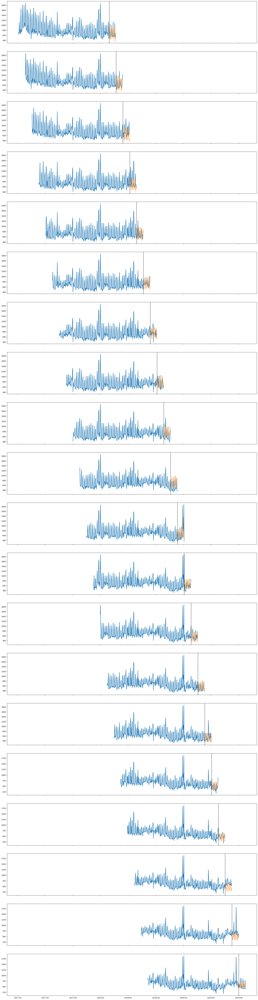

In [9]:
# set up plots
fig, axs = plt.subplots(n_splits,1, figsize=(25,n_splits*5), sharex=True)

rmse = []
mean_relative_diff = []
r2 = [] 

fold = 0

print("RMSE", '---', "MAPE" )
for train_idx, test_idx in time_splitter.split(data):

    pipeline = model.fit(X.iloc[train_idx], y=y.iloc[train_idx])

    # plot 
    axs[fold].plot(np.append(y.index.values[train_idx], y.index.values[test_idx]), 
             np.append(y.values[train_idx],y.values[test_idx]), lw=2, label="Training")

    axs[fold].plot( y.index.values[test_idx], 
                   pipeline.predict(X.iloc[test_idx]), label="Forecast")
    plt.draw()
    axs[fold].axvline(y.iloc[test_idx].index.min(), color='black', ls="--")
    fold += 1
    
    y_true = y.iloc[test_idx]
    y_pred = pipeline.predict(X.iloc[test_idx])
    
    _rmse = round(mean_squared_error(y_true,y_pred, squared=False), 2)
    _mean_relative_diff = round(np.mean(np.abs(y_true-y_pred)/y_true), 2)
    _r2 = round(r2_score(y_true,y_pred), 2)

    
    rmse.append(_rmse)
    mean_relative_diff.append(_mean_relative_diff)
    r2.append(_r2)
    
    
    print(_rmse, '\t', _mean_relative_diff, '\t', _r2)
    

print("--", 'means', "--" )
print(round(np.mean(rmse), 2), '\t', 
      round(np.mean(mean_relative_diff), 3), '\t',  
      round(np.mean(r2), 2) )
plt.show()


This very simple liner model already works quite well. On average it is wrong by 25% of the true sales volume.
Due to the simplicity it's very fast to train on large datasets and because it's linear it could be executed extremely quickly in production. 

We can try a slightly more complicated model to see if that improves performance. 

In [10]:
from sklearn.ensemble import RandomForestRegressor
model = RandomForestRegressor()

RMSE --- MAPE --- R2
72.96 	 0.09 	 0.85
94.55 	 0.13 	 0.78
155.5 	 0.15 	 0.4
180.08 	 0.13 	 0.66
187.45 	 0.17 	 -0.39
87.83 	 0.1 	 0.38
199.37 	 0.2 	 -1.12
105.03 	 0.11 	 0.61
133.47 	 0.17 	 0.67
88.91 	 0.17 	 0.76
404.97 	 0.31 	 -0.19
283.95 	 0.51 	 -3.75
95.02 	 0.15 	 0.67
66.5 	 0.13 	 0.78
146.05 	 0.22 	 0.37
190.45 	 0.29 	 -0.3
146.2 	 0.22 	 -0.5
161.86 	 0.22 	 -1.65
277.54 	 0.16 	 -0.18
120.28 	 0.22 	 0.36
-- means --
159.9 	 0.193 	 0.36


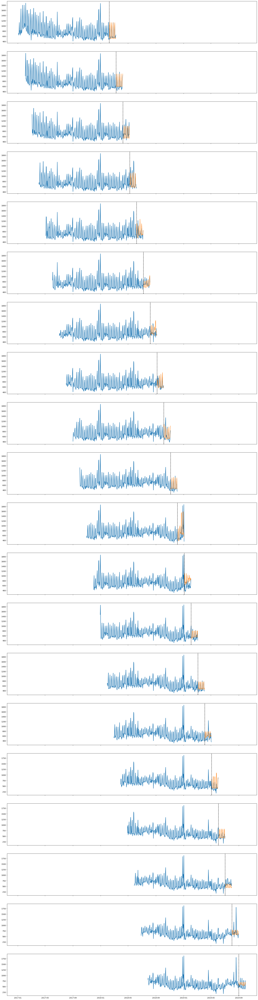

In [11]:
# set up plots
fig, axs = plt.subplots(n_splits,1, figsize=(25,n_splits*5), sharex=True)

rmse = []
mean_relative_diff = []
r2 = [] 

fold = 0

print("RMSE", '---', "MAPE", "---", "R2" )
for train_idx, test_idx in time_splitter.split(data):

    pipe = model.fit(X.iloc[train_idx], y=y.iloc[train_idx])

    # plot 
    axs[fold].plot(np.append(y.index.values[train_idx], y.index.values[test_idx]), 
             np.append(y.values[train_idx],y.values[test_idx]), lw=2, label="Training")

    axs[fold].plot( y.index.values[test_idx], 
                   pipe.predict(X.iloc[test_idx]), label="Forecast")
    plt.draw()
    axs[fold].axvline(y.iloc[test_idx].index.min(), color='black', ls="--")
    fold += 1
    
    y_true = y.iloc[test_idx]
    y_pred = pipe.predict(X.iloc[test_idx])
    
    _rmse = round(mean_squared_error(y_true,y_pred, squared=False), 2)
    _mean_relative_diff = round(np.mean(np.abs(y_true-y_pred)/y_true), 2)
    _r2 = round(r2_score(y_true,y_pred), 2)

    
    rmse.append(_rmse)
    mean_relative_diff.append(_mean_relative_diff)
    r2.append(_r2)
    
    
    print(_rmse, '\t', _mean_relative_diff, '\t', _r2)
    

print("--", 'means', "--" )
print(round(np.mean(rmse), 2), '\t', 
      round(np.mean(mean_relative_diff), 3), '\t',  
      round(np.mean(_r2), 2))
plt.show()


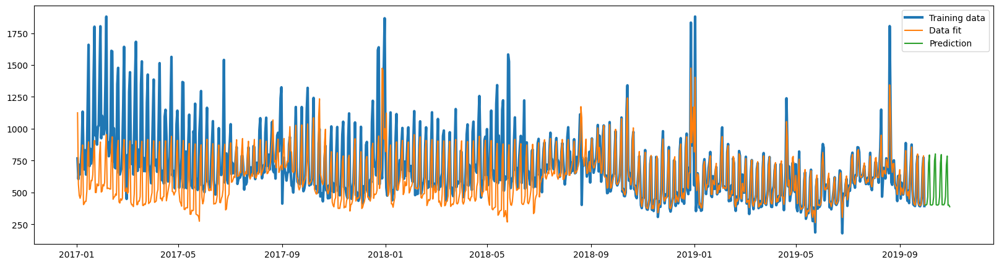

In [12]:
# 30 days after the end of the training data 
next_dates = pd.DataFrame(data=pd.date_range(start=data.reset_index()["date"].max() + pd.Timedelta('1d'), 
                           end=data.reset_index()["date"].max() + pd.Timedelta('30d'), 
                           freq='1d')
                          , columns=["date"])

# perform feature generation on new dates
next_X = ExtractDateComponents().fit(next_dates).transform(next_dates)

# fit model on 400 most recent days 
model.fit(X.iloc[-400:], y=y.iloc[-400:])

plt.figure(figsize=(20,5))
plt.plot(data.reset_index()[["date"]], 
         data.reset_index()[["sales"]], 
         lw=3, label="Training data")

plt.plot(data.reset_index()[["date"]], 
         model.predict(X), 
         label="Data fit")

plt.plot(next_dates, 
         model.predict(next_X), 
         label="Prediction")

plt.legend()

An out of the box Random Forest Regressor with default settings, 100 trees, no maximum tree depth already gives a significant improvement.  

The RandomForestRegressor struggles most when the interval to forecast is in a new year, and immediately after periods of anomalously high sales. 

The random forest is a powerful algorithm to fit arbitrary data, as can be seen in the last plot above. The training data is fit very closely, but the prediction is a relatively linear extrapolation of the most recent behavior. 

We can look at the feature importance below, to see that restricting the training to the most recent 400 days causes the year to be of less importance, and the day and week to be highest. 

We can do some general feature engineering to add some additional complexity to the feature space. Adding feature complexity while holding the number of trees constant might help to reduce over-fitting and improve general model performance.

<Axes: title={'center': 'Feature importance'}>

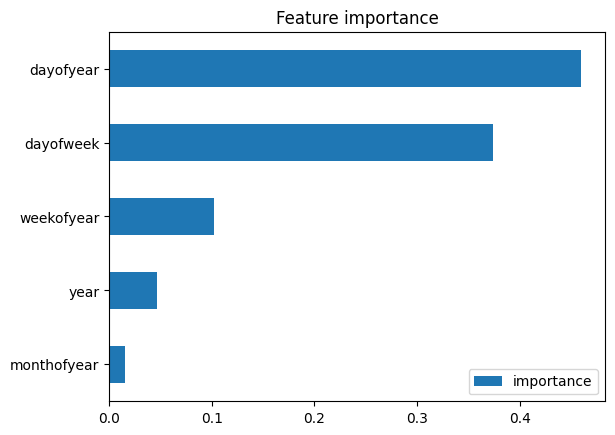

In [13]:
feat_importance = pd.DataFrame(data = model.feature_importances_, 
                               index=model.feature_names_in_, 
                               columns=["importance"])

(feat_importance
 .sort_values("importance")
 .plot(kind="barh", title="Feature importance"))


Below I define a set of features based on:
- OneHotEncoding. This expands feature space by creating a new binary feature for every day,week,month and year. 


In [15]:
from sklearn.preprocessing import OneHotEncoder

ml_pipeline = Pipeline([("extract_date", ExtractDateComponents()),
                        ("onehot", OneHotEncoder(handle_unknown="ignore")),
                        ("model", RandomForestRegressor(n_estimators=50))])

In [16]:
X = data.reset_index()[["date"]]
y = data["sales"]

In [17]:
n_splits = 20
# time series train-test split
time_splitter = TimeSeriesSplit(n_splits=n_splits, 
                                test_size=30, # target forcast lenght,
                                max_train_size=400 # limit training size to make each run equivalent
                               )

RMSE --- MAPE --- R2
170.97 	 0.14 	 0.19
162.81 	 0.16 	 0.35
133.65 	 0.14 	 0.56
171.71 	 0.11 	 0.69
167.83 	 0.14 	 -0.11
85.96 	 0.1 	 0.41
183.46 	 0.2 	 -0.8
96.55 	 0.1 	 0.67
138.57 	 0.19 	 0.64
151.65 	 0.29 	 0.3
378.08 	 0.29 	 -0.03
229.77 	 0.39 	 -2.11
88.16 	 0.14 	 0.72
87.53 	 0.17 	 0.62
129.68 	 0.14 	 0.5
239.6 	 0.36 	 -1.05
126.4 	 0.21 	 -0.12
136.86 	 0.19 	 -0.9
264.45 	 0.15 	 -0.07
168.94 	 0.31 	 -0.26
-- means --
165.63 	 0.196 	 -0.26


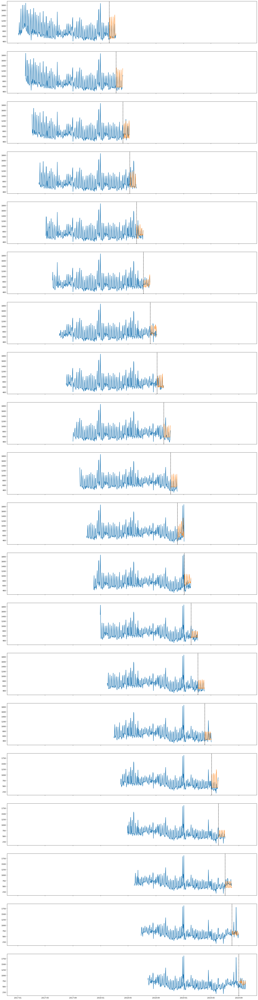

In [18]:
# set up plots
fig, axs = plt.subplots(n_splits,1, figsize=(25,n_splits*5), sharex=True)

rmse = []
mean_relative_diff = []
r2 = [] 

fold = 0

print("RMSE", '---', "MAPE", "---", "R2" )
for train_idx, test_idx in time_splitter.split(data):

    pipe = ml_pipeline.fit(X.iloc[train_idx], y=y.iloc[train_idx])

    # plot 
    axs[fold].plot(np.append(y.index.values[train_idx], y.index.values[test_idx]), 
             np.append(y.values[train_idx],y.values[test_idx]), lw=2, label="Training")

    axs[fold].plot( y.index.values[test_idx], 
                   pipe.predict(X.iloc[test_idx]), label="Forecast")
    plt.draw()
    axs[fold].axvline(y.iloc[test_idx].index.min(), color='black', ls="--")
    fold += 1
    
    y_true = y.iloc[test_idx]
    y_pred = pipe.predict(X.iloc[test_idx])
    
    _rmse = round(mean_squared_error(y_true,y_pred, squared=False), 2)
    _mean_relative_diff = round(np.mean(np.abs(y_true-y_pred)/y_true), 2)
    _r2 = round(r2_score(y_true,y_pred), 2)

    
    rmse.append(_rmse)
    mean_relative_diff.append(_mean_relative_diff)
    r2.append(_r2)
    
    
    print(_rmse, '\t', _mean_relative_diff, '\t', _r2)
    

print("--", 'means', "--" )
print(round(np.mean(rmse), 2), '\t', 
      round(np.mean(mean_relative_diff), 3), '\t',  
      round(np.mean(_r2), 2))
plt.show()


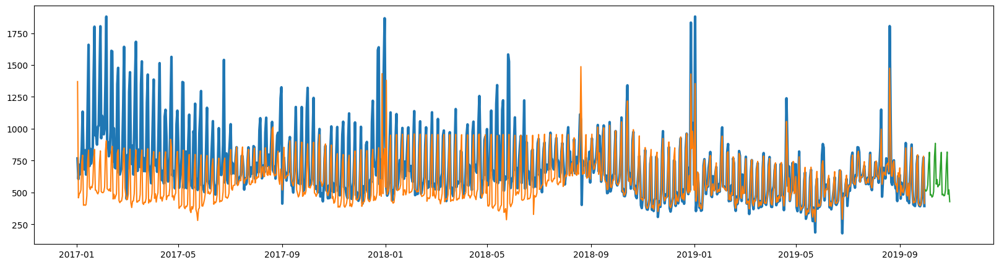

In [20]:
ml_pipeline.fit(data.reset_index()[["date"]].iloc[-400:], 
                y=data["sales"].iloc[-400:])

plt.figure(figsize=(20,5))
plt.plot(data.reset_index()[["date"]], data.reset_index()[["sales"]], lw=3)

plt.plot(data.reset_index()[["date"]], ml_pipeline.predict(data.reset_index()[["date"]]))
plt.plot(next_dates, ml_pipeline.predict(next_dates))

Now we see that the added complexity in the feature space has indeed made the predicted output look more non-linear. By eye that looks like a plausible future! The peaks and valleys in sales have some underlying structure that wasnt present before. 

Unfortunately looking at the statistical tests comparing the predicted forecast to the true future values this model actually preforms worse. RMSE wen from to 161.38 to 167.79 and MAPE from  0.196 to 0.198, while not a significant decrease we have greatly increased the complexity of the model. This could present a challenge for deployment if very low latency prediction are required. 

Below we see that the top 20 features by relative importance are all days. This could point to use still overfitting. or it could mean that indeed spending habits. 

I did also reduce the number of trees to get a better fit. A full grid search of hyper parameters would ensure the best choices here. But I think that's beyond the scope of this exercise. 

<Axes: title={'center': 'Feature importance'}>

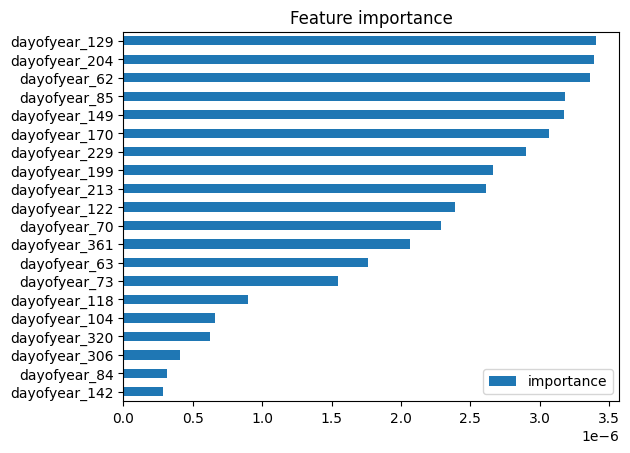

In [21]:
feat_importance = pd.DataFrame(data = ml_pipeline.steps[-1][-1].feature_importances_, 
                               index=ml_pipeline.steps[-2][-1].get_feature_names_out(), 
                               columns=["importance"])

(feat_importance
 .sort_values("importance").head(20)
 .plot(kind="barh", title="Feature importance"))

Lastly I will try to add some features informed by expected customer behavior. 

It's reasonable to expect people to buy things in stores mostly on the weekends, and especially mostly before Christmas. Here I define some features which express those behaviour. 

In [22]:
from pandas.tseries.holiday import AbstractHolidayCalendar, Holiday, \
    DateOffset, MO,TH, next_monday, next_monday_or_tuesday, GoodFriday, EasterMonday, Easter


class Holidays_Netherlands(AbstractHolidayCalendar):
    rules = [
        Holiday('New Years Day', month=1, day=1, observance=next_monday),
        Holiday('Christmas Day', month=12, day=25, observance=next_monday),
        Holiday('Boxing Day', month=12, day=26, observance=next_monday_or_tuesday)
    ]


class NearHoliday(BaseEstimator, TransformerMixin):
    
    def fit(self, X, y=None):
        return self

    def transform(self, X):
        
        # create a list of shopping holidays in X date interval
        holidays = pd.concat([pd.DataFrame(Holidays_Netherlands().holidays(start=X["date"].min(), 
                                                                           end=X["date"].max())
                                           + pd.Timedelta(f"{n}d")) for n in np.arange(-7, +3)
                             ]) 

        holidays["is_holiday"] = np.ones(len(holidays), dtype=int)

        holiday_weeks = (X.merge(holidays, left_on="date",right_on=0, how="left")
                         .fillna(0)[["date", "is_holiday"]]
                         .drop_duplicates())
        
        return holiday_weeks.fillna(0)
    
    
class IsWeekend(BaseEstimator, TransformerMixin):
    
    def fit(self, X, y=None):
        return self

    def transform(self, X):
        
        is_weekend = pd.DataFrame(data=np.array(X["date"].dt.dayofweek > 4).astype(int),
                                  index=X.index, 
                                  columns=["is_weekend"])
        
        return pd.concat([X, is_weekend], axis=1)
    
class ExtractDateComponents(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X):
        date_components = pd.DataFrame({#"dayofyear": X["date"].apply(lambda y: y.dayofyear),
#                              "dayofweek": X["date"].apply(lambda y: y.dayofweek),
                             "weekofyear": X["date"].apply(lambda y: y.isocalendar().week),
                             "monthofyear": X["date"].apply(lambda y: y.month), 
                             "year": X["date"].apply(lambda y: y.year)},
                            index=X.index)
        
        return pd.concat([X[["is_holiday", "is_weekend"]], date_components], axis=1)

In [23]:

ml_pipeline = Pipeline([("near_holiday", NearHoliday()),
                        ("is_weekend", IsWeekend()),                        
                        ("extract_date", ExtractDateComponents()),
                        ("model", RandomForestRegressor(n_estimators=100))])

In [24]:
X = data.reset_index()[["date"]]
y = data["sales"]

In [25]:
n_splits = 20
# time series train-test split
time_splitter = TimeSeriesSplit(n_splits=n_splits, 
                                test_size=30, # target forcast lenght,
                                max_train_size=400 # limit training size to make each run equivalent
                               )

RMSE --- MAPE --- R2
91.06 	 0.11 	 0.77
89.62 	 0.11 	 0.8
147.0 	 0.14 	 0.46
183.62 	 0.13 	 0.64
167.55 	 0.16 	 -0.11
85.79 	 0.1 	 0.41
215.01 	 0.23 	 -1.47
104.63 	 0.11 	 0.62
142.59 	 0.17 	 0.62
93.44 	 0.18 	 0.73
416.35 	 0.35 	 -0.25
365.94 	 0.69 	 -6.9
102.15 	 0.16 	 0.62
55.59 	 0.1 	 0.85
137.27 	 0.18 	 0.44
199.8 	 0.41 	 -0.43
148.15 	 0.22 	 -0.54
168.54 	 0.24 	 -1.88
270.79 	 0.15 	 -0.12
127.13 	 0.23 	 0.29
-- means --
165.6 	 0.208 	 0.29


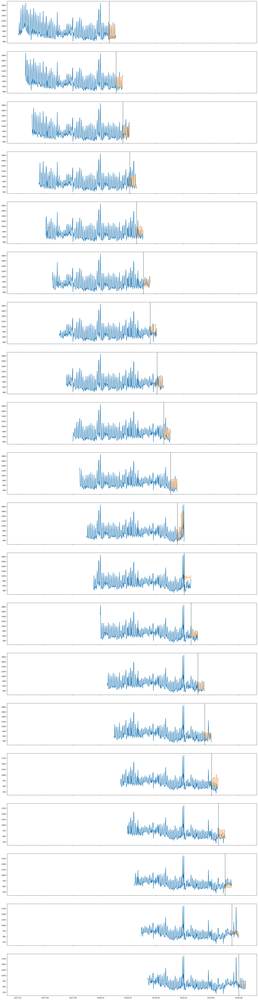

In [26]:
# set up plots
fig, axs = plt.subplots(n_splits,1, figsize=(25,n_splits*5), sharex=True)

rmse = []
mean_relative_diff = []
r2 = [] 

fold = 0

print("RMSE", '---', "MAPE", "---", "R2" )
for train_idx, test_idx in time_splitter.split(data):

    pipe = ml_pipeline.fit(X.iloc[train_idx], y=y.iloc[train_idx])

    # plot 
    axs[fold].plot(np.append(y.index.values[train_idx], y.index.values[test_idx]), 
             np.append(y.values[train_idx],y.values[test_idx]), lw=2, label="Training")

    axs[fold].plot( y.index.values[test_idx], 
                   pipe.predict(X.iloc[test_idx]), label="Forecast")
    plt.draw()
    axs[fold].axvline(y.iloc[test_idx].index.min(), color='black', ls="--")
    fold += 1
    
    y_true = y.iloc[test_idx]
    y_pred = pipe.predict(X.iloc[test_idx])
    
    _rmse = round(mean_squared_error(y_true,y_pred, squared=False), 2)
    _mean_relative_diff = round(np.mean(np.abs(y_true-y_pred)/y_true), 2)
    _r2 = round(r2_score(y_true,y_pred), 2)

    
    rmse.append(_rmse)
    mean_relative_diff.append(_mean_relative_diff)
    r2.append(_r2)
    
    
    print(_rmse, '\t', _mean_relative_diff, '\t', _r2)
    

print("--", 'means', "--" )
print(round(np.mean(rmse), 2), '\t', 
      round(np.mean(mean_relative_diff), 3), '\t',  
      round(np.mean(_r2), 2))
plt.show()


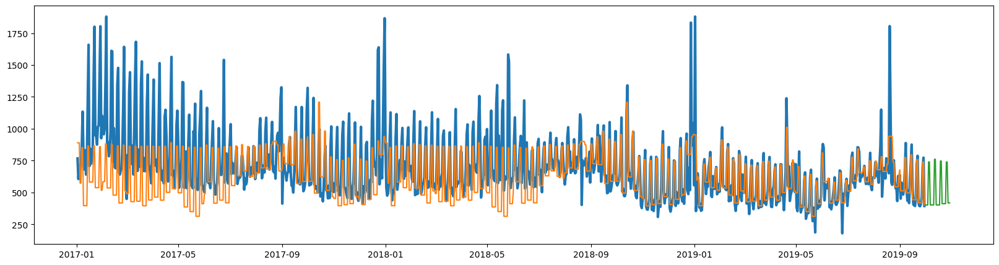

In [27]:
ml_pipeline.fit(data.reset_index()[["date"]].iloc[-400:], 
                y=data["sales"].iloc[-400:])

plt.figure(figsize=(20,5))
plt.plot(data.reset_index()[["date"]], data.reset_index()[["sales"]], lw=3)

plt.plot(data.reset_index()[["date"]], ml_pipeline.predict(data.reset_index()[["date"]]))
plt.plot(next_dates, ml_pipeline.predict(next_dates))

In this test we see that more weak learners are able to produce forecasts which are statistically better than models with many more features. I was able to remove the all of the days of the year and replace them with only weekend or holiday weekend features. this in combination with the week and month provides enough information for a good model. 



<Axes: title={'center': 'Feature importance'}>

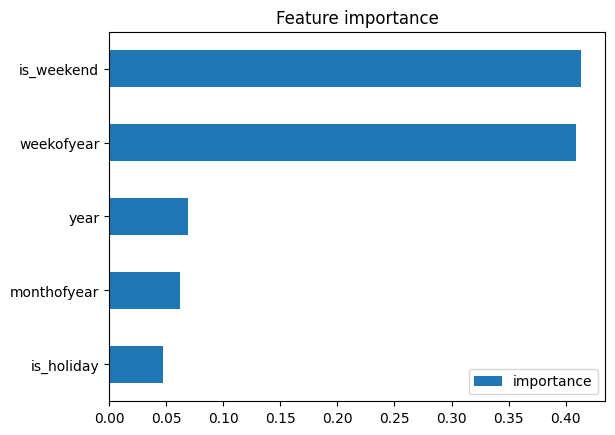

In [28]:
feat_importance = pd.DataFrame(data = ml_pipeline.steps[-1][-1].feature_importances_, 
                               index= ml_pipeline.steps[-1][-1].feature_names_in_, 
                               columns=["importance"])

(feat_importance
 .sort_values("importance").head(20)
 .plot(kind="barh", title="Feature importance"))

 <a id='additional_features'></a>

 
## Additional exploration.

Below I define a set of features based on:
- Repeating basis functions. This is similar to OneHotEncoding the day,week,month,year, but it adds Gaussian centered on each values. This informs the model of the cyclic nature of units of time, day 7 is closer to day 1 than day 3 for example. 

 [back to top](#top)

In [29]:
from sklego.preprocessing import RepeatingBasisFunction
    
class ExtractDateComponents(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X):


        return pd.DataFrame({"dayofyear": X["date"].apply(lambda y: y.dayofyear),
                             "dayofweek": X["date"].apply(lambda y: y.dayofweek),
                             "weekofyear": X["date"].apply(lambda y: y.isocalendar().week),
                             "monthofyear": X["date"].apply(lambda y: y.month), 
                             "year": X["date"].apply(lambda y: y.year)},
                            index=X.index)

class RBFDayofYear(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.rbf_dayofyear = RepeatingBasisFunction(n_periods=364, #364 days to match sucessive weekdays year-to-year
                                                    remainder='drop',
                                                    column='dayofyear',
                                                    width=2,
                                                    input_range=(1,364))
    def fit(self, X, y=None):       
        self.rbf_dayofyear.fit(X, y=y)
        return self
    
    def transform(self, X):
        rbf_matrix = self.rbf_dayofyear.pipeline_.transform(X)
        
        df_transformed = pd.concat([X.drop(columns='dayofyear'), pd.DataFrame(data=rbf_matrix,
                                                    index=X.index, 
                                                    columns=[f"dayofyear_{str(num).zfill(3)}"
                                                             for num in range(rbf_matrix.shape[1])])], 
                         axis=1)
        
        return df_transformed
    
    
class RBFDayofWeek(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.rbf_dayofweek = RepeatingBasisFunction(n_periods=7,
                                                    remainder='drop',
                                                    column='dayofweek',
                                                    width=1,
                                                    input_range=(1,7))
    def fit(self, X, y=None):       
        self.rbf_dayofweek.fit(X, y=y)
        return self
    
    def transform(self, X):
        rbf_matrix = self.rbf_dayofweek.pipeline_.transform(X)
        
        df_transformed = pd.concat([X.drop(columns='dayofweek'), pd.DataFrame(data=rbf_matrix,
                                                    index=X.index, 
                                                    columns=[f"dayofweek_{str(num).zfill(1)}"
                                                             for num in range(rbf_matrix.shape[1])])], 
                         axis=1)
        
        return df_transformed
    
    
class RBFWeekofYear(BaseEstimator, TransformerMixin):
    
    def __init__(self):
        
        self.rbf_weekofyear = RepeatingBasisFunction(n_periods=52,
                                 remainder='drop',
                                 column='weekofyear',
                                                     width=3,
                                 input_range=(1,52))
        
    def fit(self, X, y=None):       
        self.rbf_weekofyear.fit(X, y=y)
        return self
    
    def transform(self, X):
        rbf_matrix = self.rbf_weekofyear.pipeline_.transform(X)
        
        return pd.concat([X.drop(columns='weekofyear'), pd.DataFrame(data=rbf_matrix, 
                                          index=X.index, 
                                          columns=[f"weekofyear_{str(num).zfill(2)}"
                                                   for num in range(rbf_matrix.shape[1])])], 
                         axis=1)

class RBFTwoWeekofYear(BaseEstimator, TransformerMixin):
    
    def __init__(self):
        
        self.rbf_weekofyear = RepeatingBasisFunction(n_periods=26,
                                 remainder='drop',
                                 column='weekofyear',
                                                     width=3,
                                 input_range=(1,26))
        
    def fit(self, X, y=None):       
        self.rbf_weekofyear.fit(X, y=y)
        return self
    
    def transform(self, X):
        rbf_matrix = self.rbf_weekofyear.pipeline_.transform(X)
        
        return pd.concat([X.drop(columns='weekofyear'), pd.DataFrame(data=rbf_matrix, 
                                          index=X.index, 
                                          columns=[f"two_weekofyear_{str(num).zfill(2)}"
                                                   for num in range(rbf_matrix.shape[1])])], 
                         axis=1)

class RBFMonthofYear(BaseEstimator, TransformerMixin):
    
    def __init__(self):
        self.rbf_monthofyear = RepeatingBasisFunction(n_periods=12,
                                                      remainder='drop',
                                                      column='monthofyear',
                                                      width=1,
                                                      input_range=(1,12))
    
    def fit(self, X, y=None):

        self.rbf_monthofyear.fit(X, y=y)
        return self
    
    def transform(self, X):
        rbf_matrix = self.rbf_monthofyear.pipeline_.transform(X)
        
        return pd.concat([X.drop(columns='monthofyear'), pd.DataFrame(data=rbf_matrix, 
                                          index=X.index, 
                                          columns=[f"monthofyear_{str(num).zfill(2)}"
                                                   for num in range(rbf_matrix.shape[1])])], 
                         axis=1)


In [30]:
from sklearn.linear_model import Ridge, Lasso

ml_pipeline = Pipeline([("extract_date", ExtractDateComponents()),
                        ('dayofyear', RBFDayofYear()),
                        ('dayofweek', RBFDayofWeek()),
                        ('weekofyear', RBFWeekofYear()),
                        ('monthofyear', RBFMonthofYear()),
                        ("model", Lasso(max_iter=10000))])


In [31]:
X = data.reset_index()[["date"]]
y = data["sales"]

In [32]:
n_splits = 20
# time series train-test split
time_splitter = TimeSeriesSplit(n_splits=n_splits, 
                                test_size=30, # target forcast lenght,
                                max_train_size=400
                               )

RMSE --- MAPE --- R2
159.75 	 0.2 	 0.29
156.62 	 0.18 	 0.4
217.24 	 0.22 	 -0.17
268.92 	 0.22 	 0.23
181.91 	 0.18 	 -0.31
107.15 	 0.12 	 0.08
164.82 	 0.19 	 -0.45
166.69 	 0.18 	 0.02
169.39 	 0.18 	 0.46
165.69 	 0.29 	 0.16
350.0 	 0.26 	 0.11
116.65 	 0.18 	 0.2
129.92 	 0.18 	 0.39
120.27 	 0.22 	 0.29
147.95 	 0.22 	 0.35
245.04 	 0.56 	 -1.15
113.83 	 0.22 	 0.09
123.64 	 0.17 	 -0.55
281.9 	 0.18 	 -0.21
175.11 	 0.33 	 -0.36
-- means --
178.12 	 0.224 	 -0.36


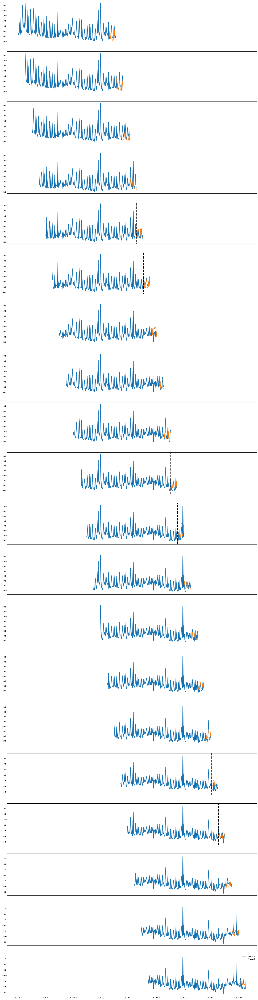

In [33]:
# set up plots
fig, axs = plt.subplots(n_splits,1, figsize=(25,n_splits*5), sharex=True)

rmse = []
mean_relative_diff = []
r2 = [] 

fold = 0

print("RMSE", '---', "MAPE", "---", "R2" )
for train_idx, test_idx in time_splitter.split(data):

    pipe = ml_pipeline.fit(X.iloc[train_idx], y=y.iloc[train_idx])

    # plot 
    axs[fold].plot(np.append(y.index.values[train_idx], y.index.values[test_idx]), 
             np.append(y.values[train_idx],y.values[test_idx]), lw=2, label="Training")

    axs[fold].plot( y.index.values[test_idx], 
                   pipe.predict(X.iloc[test_idx]), label="Forecast")
    plt.draw()
    axs[fold].axvline(y.iloc[test_idx].index.min(), color='black', ls="--")
    fold += 1
    
    y_true = y.iloc[test_idx]
    y_pred = pipe.predict(X.iloc[test_idx])
    
    _rmse = round(mean_squared_error(y_true,y_pred, squared=False), 2)
    _mean_relative_diff = round(np.mean(np.abs(y_true-y_pred)/y_true), 2)
    _r2 = round(r2_score(y_true,y_pred), 2)

    
    rmse.append(_rmse)
    mean_relative_diff.append(_mean_relative_diff)
    r2.append(_r2)
    
    
    print(_rmse, '\t', _mean_relative_diff, '\t', _r2)
    

print("--", 'means', "--" )
print(round(np.mean(rmse), 2), '\t', 
      round(np.mean(mean_relative_diff), 3), '\t',  
      round(np.mean(_r2), 2))
plt.legend()
plt.show()


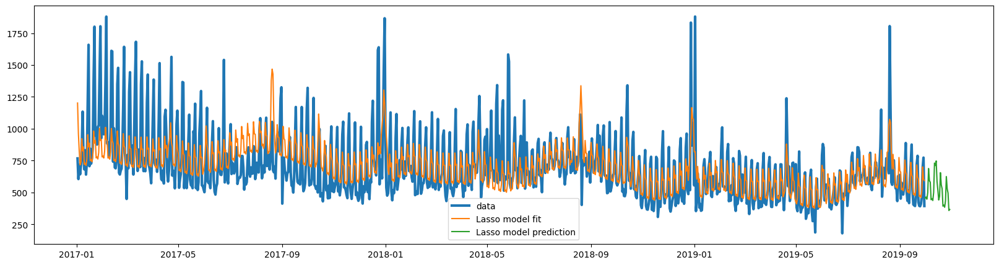

In [34]:
ml_pipeline.fit(data.reset_index()[["date"]].iloc[-400:], 
                y=data["sales"].iloc[-400:])

plt.figure(figsize=(20,5))
plt.plot(data.reset_index()[["date"]], 
         data.reset_index()[["sales"]], lw=3, label="data")

plt.plot(data.reset_index()[["date"]], 
         ml_pipeline.predict(data.reset_index()[["date"]]), label="Lasso model fit")

plt.plot(next_dates, ml_pipeline.predict(next_dates), label="Lasso model prediction")

plt.legend()

In [35]:
len(ml_pipeline.steps[-1][-1].feature_names_in_)

436

For a linear model, this doesn't do too badly! the only issue is that 436 feature are generated. The Lasso algorithm applies a regularization that reduces the number of effective features by  setting many weights to zero. But in this sklearn pipeline formalism that doesn't save any computation time.  

Because this is a linear model it is very fast to train and can be deployed in in an extremely fast manner as well. Even faster if only the features with nonzero weights are generated.  



 <a id='select_model'></a>

## Final model selection 
 
 
Results:
        
    RMSE     MAPE    R2

LinearRegression with straight forward day,week,month,year:

    175.25 	 0.218 	 -0.08

Random forest with straight forward day,week,month,year:

    159.9 	 0.193 	 0.36

Random forest with OneHotEncoded day,week,month,year:

    165.63 	 0.196 	 -0.26

Random forest with "domain knowledge" features:

    165.6 	 0.208 	 0.29

Lasso:

    178.12 	 0.224 	 -0.36
 
 
 
Therefore the simplest and best performing model can be selected, that's just a random forest with just the basic date information parsed and passed as features. 
 
 [back to top](#top)

 <a id='next_step'></a>
 next_step
## Next steps

Additional things to explore include

- Lag features: This requires additional information to be saved on the server to access during prediction. 

- Product information features: Initially I investigated whether product releases, as determined by the first occurrence in the dataset could be predictive. Unfortunately this information would not be present in deployment when only a data is provided. 

- Additional business info: features relating to discounts, promotions, new ad campaigns can also be included. This would need to be accessible to the app running the model prediction. 
 
 
 [back to top](#top)